In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import joblib
import os
import cv2
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
import random
from concurrent.futures import ThreadPoolExecutor, as_completed
import requests
from io import BytesIO
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
# Load from file

Gender_model = joblib.load('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Pre-trained/Gender_SVM_Model_1.pkl')


Gender_model

SVC()

In [ ]:
# Load from file

Age_model = joblib.load('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Pre-trained/Age_SVM_Model_1.pkl')


Age_model

SVC()

In [ ]:
print("Type of scaler:", type(Age_model))


Type of scaler: <class 'sklearn.svm._classes.SVC'>


In [ ]:
scaler = joblib.load('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Pre-trained/scaler.pkl')
pca = joblib.load('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Pre-trained/pca.pkl')

In [ ]:
print("Type of scaler:", type(pca))


Type of scaler: <class 'sklearn.decomposition._pca.PCA'>


In [ ]:
def process_and_predict(file):
    img_origin = cv2.imread(file)
    if img_origin is None:
        raise ValueError(f"Image not found at path: {file}")

    img = cv2.resize(img_origin, (128, 128))
    # img_equalized = equalize_brightness(img)

    # Convert BGR to gray
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_canny = cv2.Canny(gray, 100, 200)

    # Flatten and reshape for model input
    img_canny = img_canny.flatten().reshape(1, -1)

    # Scale the features (assuming scaler is already fitted on training data)
    img_canny = scaler.transform(img_canny)

    # Apply PCA for dimensionality reduction (assuming pca is already fitted on training data)
    img_canny = pca.transform(img_canny)

    # Predict age and gender
    age = Age_model.predict(img_canny)
    gender = Gender_model.predict(img_canny)

    # Interpret the results
    gender_label = 'male' if gender == 0 else 'female'
    age_labels = ['0-6', '7-19', '20-32', '33-55', '56+']
    age_label = age_labels[age[0]]

    # Display the original image with prediction results
    img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f'Age: {age_label} \nGender: {gender_label}')
    plt.axis('off')
    plt.show()

In [ ]:
def demo(folder):
    images = []
    for file in os.listdir(folder):
        path = os.path.join(folder, file)
        try:
            img, age, gender = process_and_predict(path)
            # Convert the image to RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append((img_rgb, f'Age: {age} \nGender: {gender}'))
        except Exception as e:
            print(f"Error processing {file}: {e}")

    if images:
        fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
        for ax, (img, label) in zip(axes, images):
            ax.imshow(img)
            ax.set_title(label)
            ax.axis('off')
        plt.tight_layout()
        plt.show()


In [ ]:
def process_and_predict_url(url):
    # Download image from URL
    response = requests.get(url)
    img_origin = Image.open(BytesIO(response.content))
    img_origin = cv2.cvtColor(np.array(img_origin), cv2.COLOR_RGB2BGR)

    img = cv2.resize(img_origin, (128, 128))

    # Convert BGR to gray
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_canny = cv2.Canny(gray, 50, 100)

    # Flatten and reshape for model input
    img_canny = img_canny.flatten().reshape(1, -1)

    # Scale the features (assuming scaler is already fitted on training data)
    img_canny = scaler.transform(img_canny)

    # Apply PCA for dimensionality reduction (assuming pca is already fitted on training data)
    img_canny = pca.transform(img_canny)

    # Predict age and gender
    age = Age_model.predict(img_canny)
    gender = Gender_model.predict(img_canny)

    # Interpret the results
    gender_label = 'male' if gender == 0 else 'female'
    age_labels = ['0-6', '7-19', '20-32', '33-55', '56+']
    age_label = age_labels[age[0]]

    # Display the original image with prediction results
    img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f'Age: {age_label} \nGender: {gender_label}')
    plt.axis('off')
    plt.show()


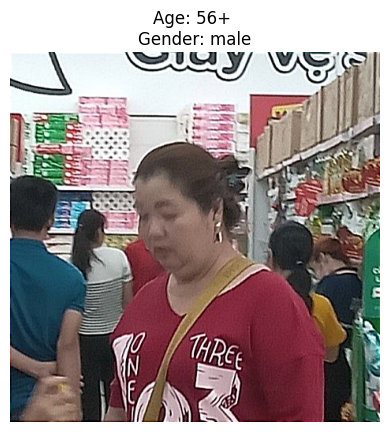

Error processing img1.jpg: cannot unpack non-iterable NoneType object


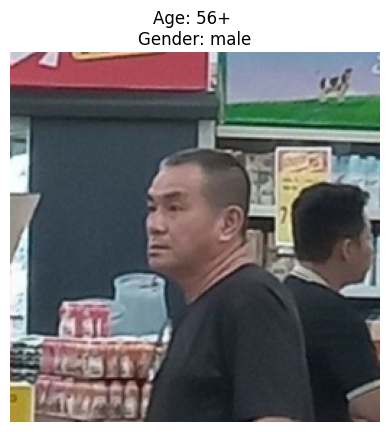

Error processing img2.jpg: cannot unpack non-iterable NoneType object


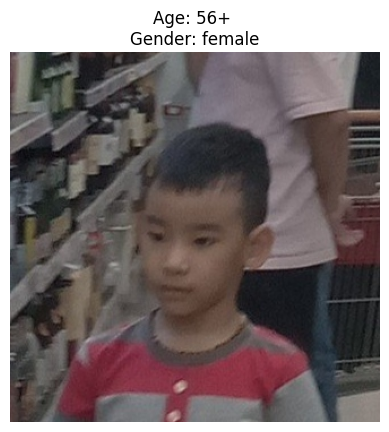

Error processing img3.jpg: cannot unpack non-iterable NoneType object


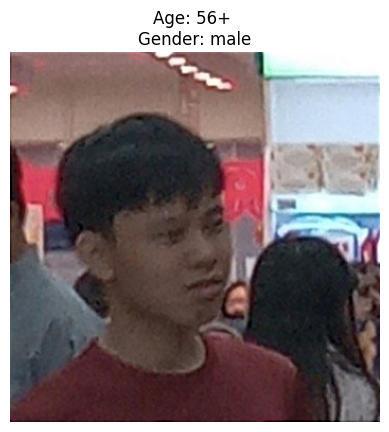

Error processing img4.jpg: cannot unpack non-iterable NoneType object


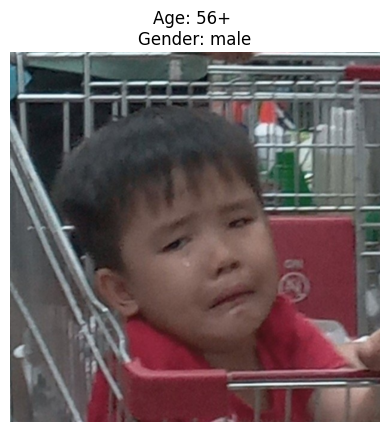

Error processing img5.jpg: cannot unpack non-iterable NoneType object


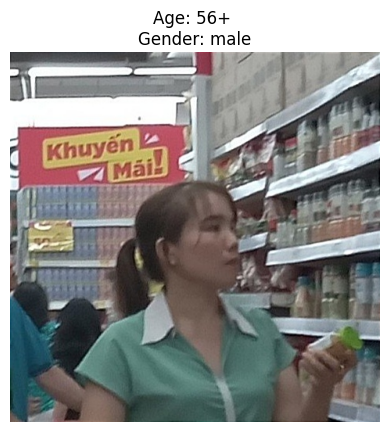

Error processing img6.jpg: cannot unpack non-iterable NoneType object


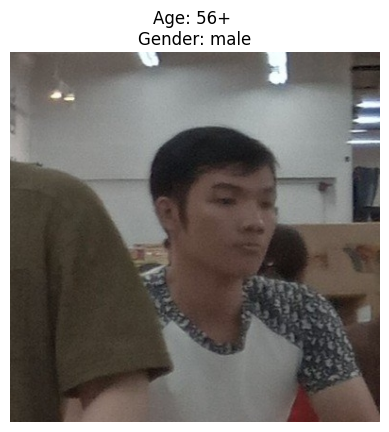

Error processing img7.jpg: cannot unpack non-iterable NoneType object


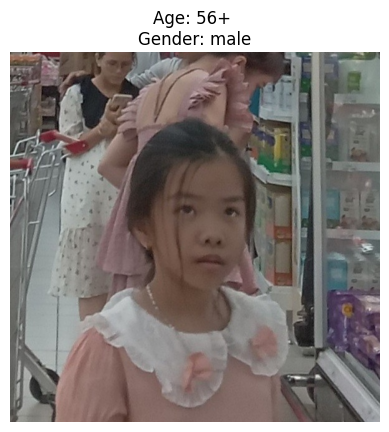

Error processing img8.jpg: cannot unpack non-iterable NoneType object


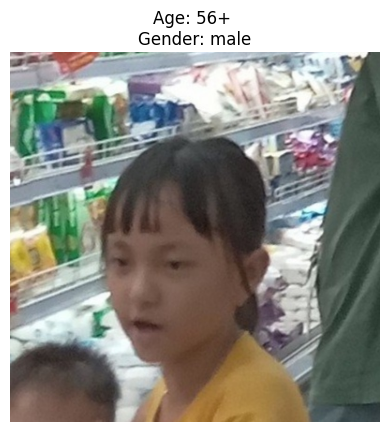

Error processing img9.jpg: cannot unpack non-iterable NoneType object


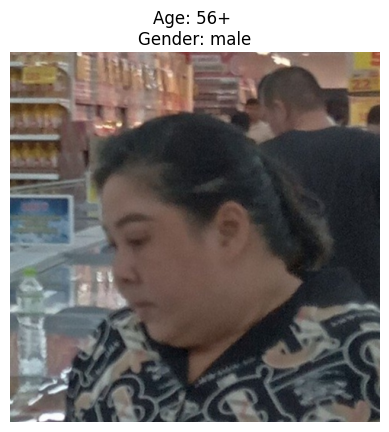

Error processing img10.jpg: cannot unpack non-iterable NoneType object


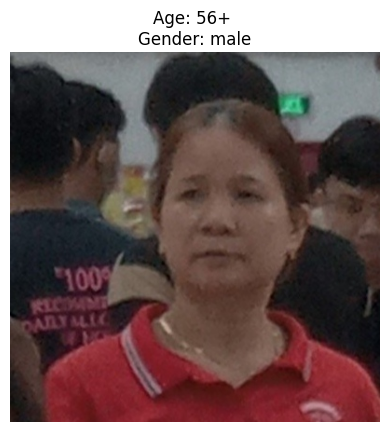

Error processing img11.jpg: cannot unpack non-iterable NoneType object


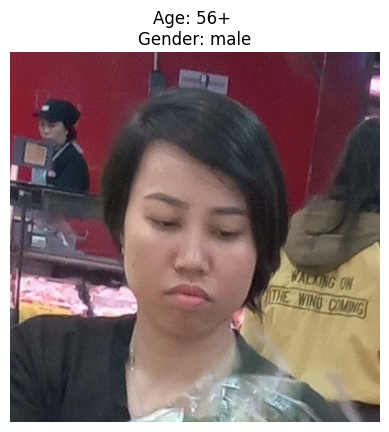

Error processing img12.jpg: cannot unpack non-iterable NoneType object


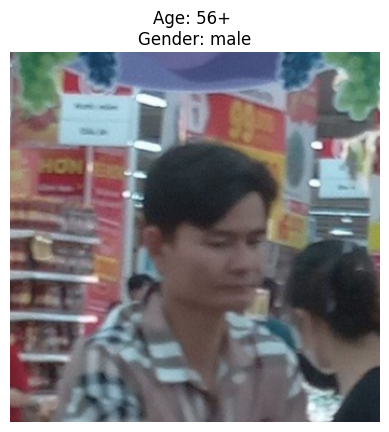

Error processing img13.jpg: cannot unpack non-iterable NoneType object


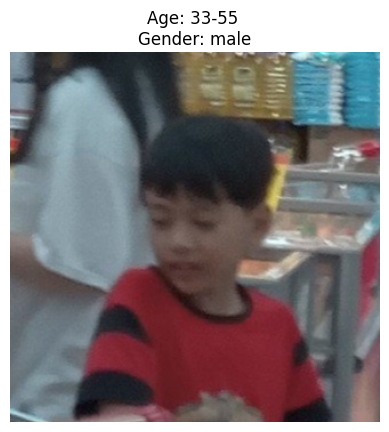

Error processing img14.jpg: cannot unpack non-iterable NoneType object


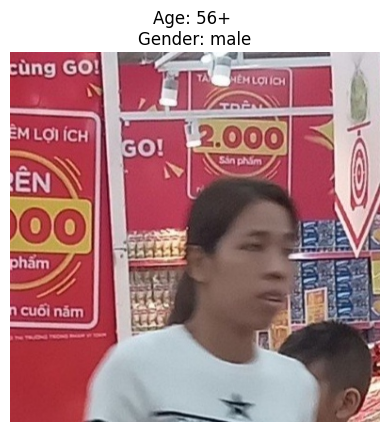

Error processing img15.jpg: cannot unpack non-iterable NoneType object


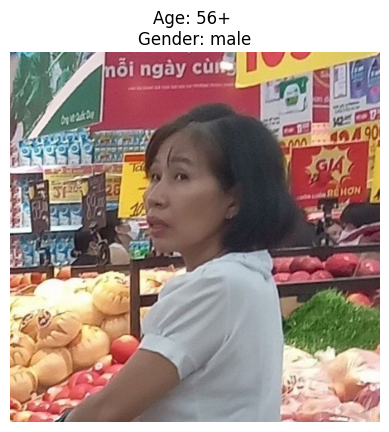

Error processing img16.jpg: cannot unpack non-iterable NoneType object


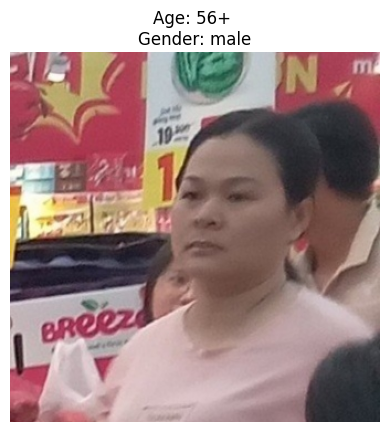

Error processing img17.jpg: cannot unpack non-iterable NoneType object


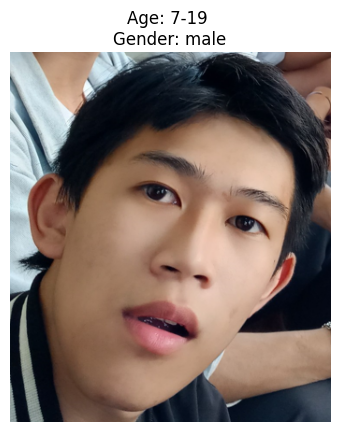

Error processing khanh1.png: cannot unpack non-iterable NoneType object


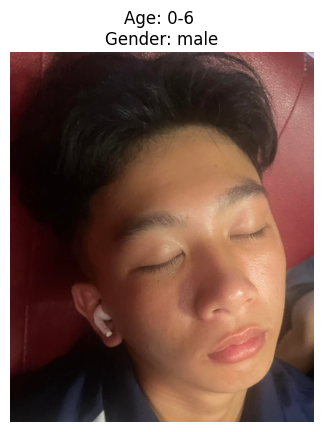

Error processing img18.jpg: cannot unpack non-iterable NoneType object


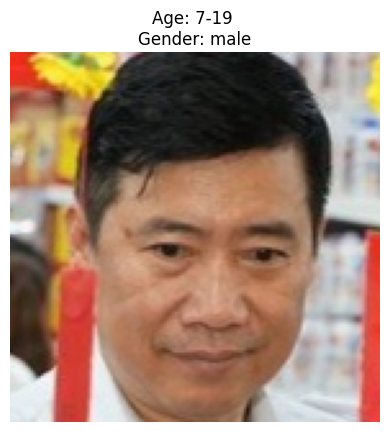

Error processing img19.jpg: cannot unpack non-iterable NoneType object


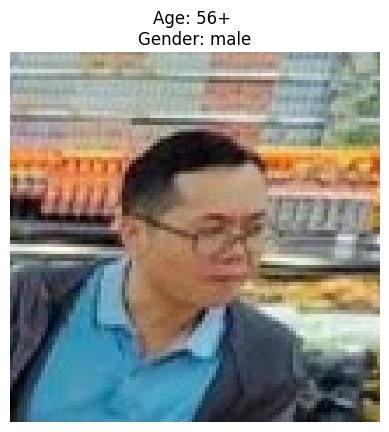

Error processing img20.jpg: cannot unpack non-iterable NoneType object


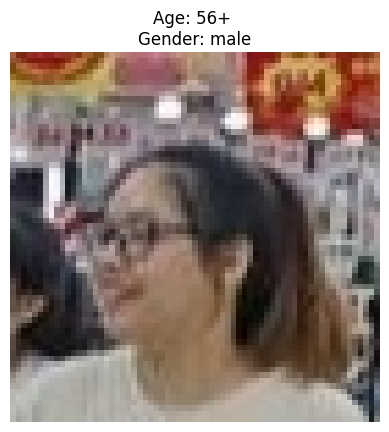

Error processing img21.jpg: cannot unpack non-iterable NoneType object


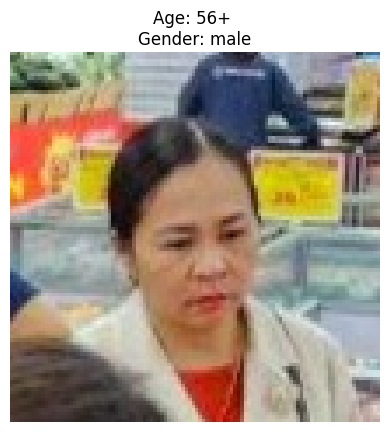

Error processing img22.jpg: cannot unpack non-iterable NoneType object


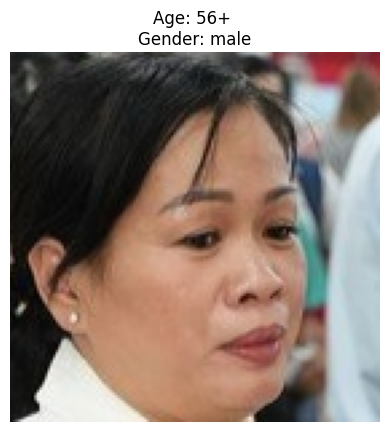

Error processing img23.jpg: cannot unpack non-iterable NoneType object


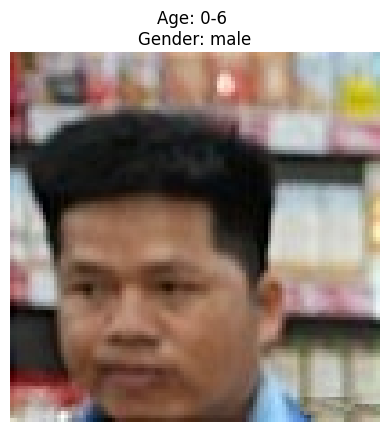

Error processing img24.jpg: cannot unpack non-iterable NoneType object


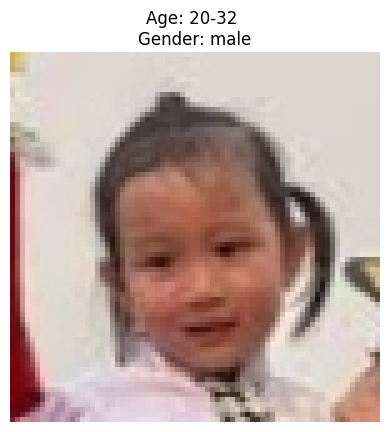

Error processing img25.jpg: cannot unpack non-iterable NoneType object


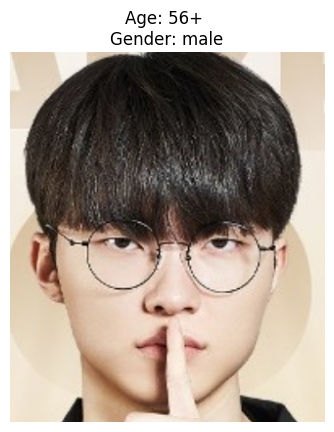

Error processing img26.jpg: cannot unpack non-iterable NoneType object


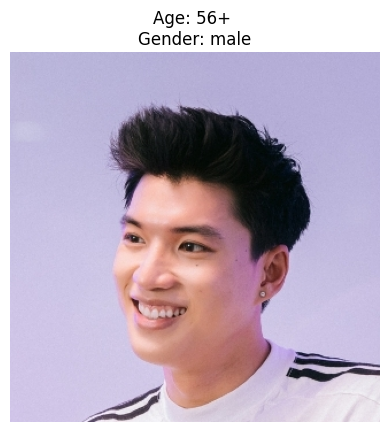

Error processing img27.jpg: cannot unpack non-iterable NoneType object


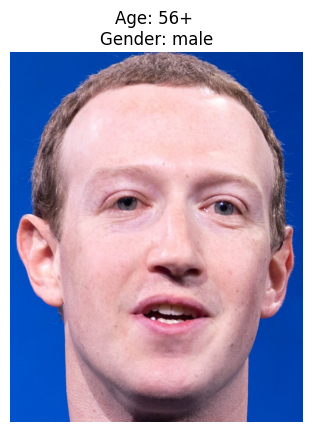

Error processing img28.jpg: cannot unpack non-iterable NoneType object


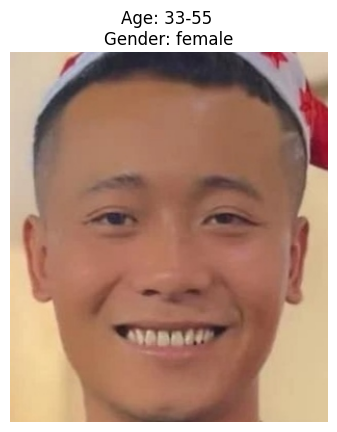

Error processing img29.jpg: cannot unpack non-iterable NoneType object


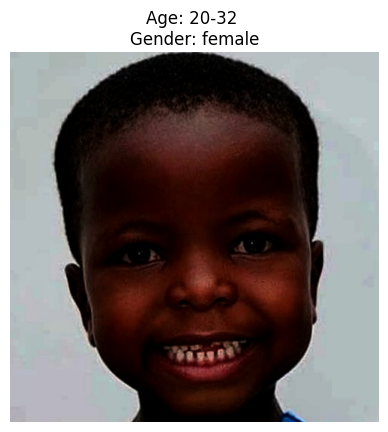

Error processing img30.jpg: cannot unpack non-iterable NoneType object


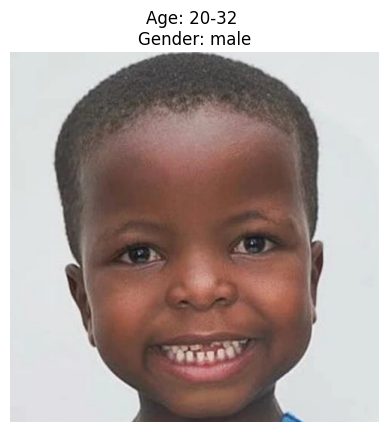

Error processing img31.jpg: cannot unpack non-iterable NoneType object


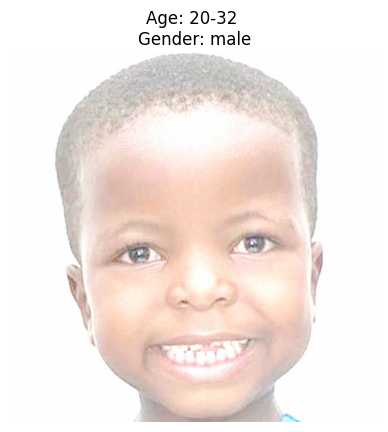

Error processing img32.jpg: cannot unpack non-iterable NoneType object


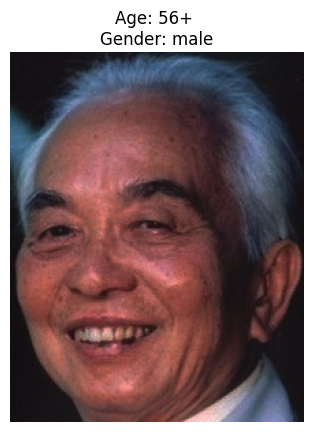

Error processing img33.jpg: cannot unpack non-iterable NoneType object


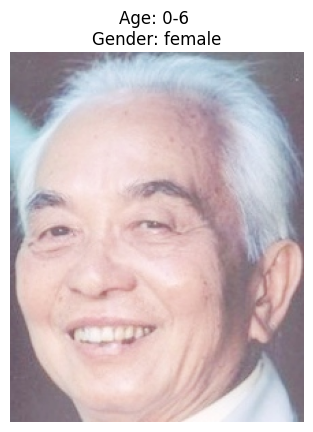

Error processing img34.jpg: cannot unpack non-iterable NoneType object


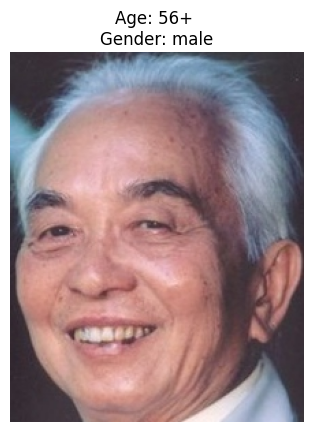

Error processing img35.jpg: cannot unpack non-iterable NoneType object


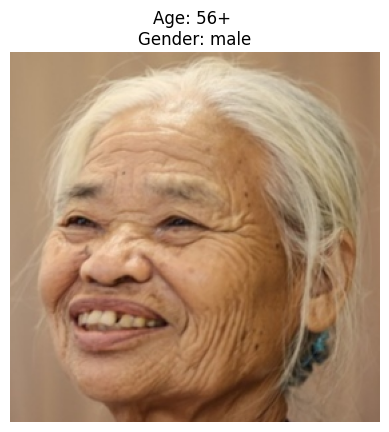

Error processing img36.jpg: cannot unpack non-iterable NoneType object


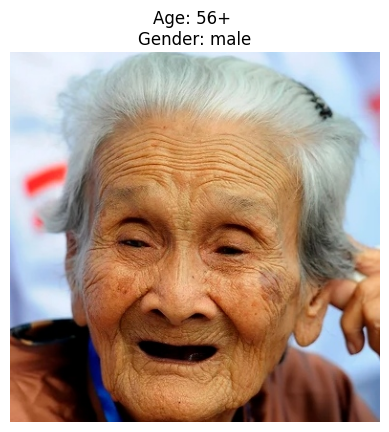

Error processing img37.jpg: cannot unpack non-iterable NoneType object


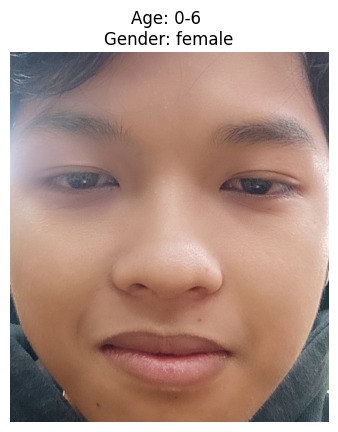

Error processing linh.jpg: cannot unpack non-iterable NoneType object


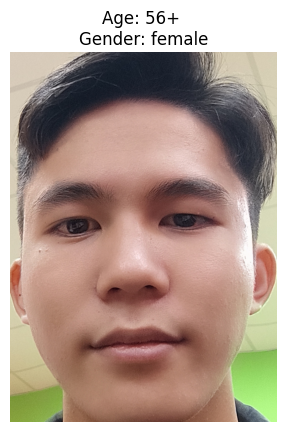

Error processing vinh.jpg: cannot unpack non-iterable NoneType object


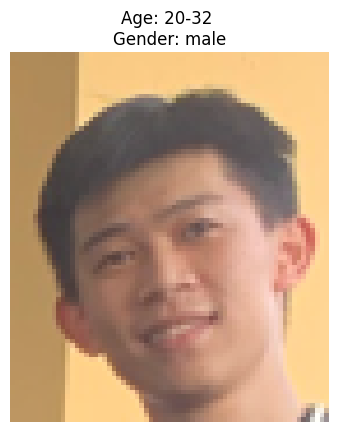

Error processing khanh.png: cannot unpack non-iterable NoneType object


In [ ]:
demo('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Test')

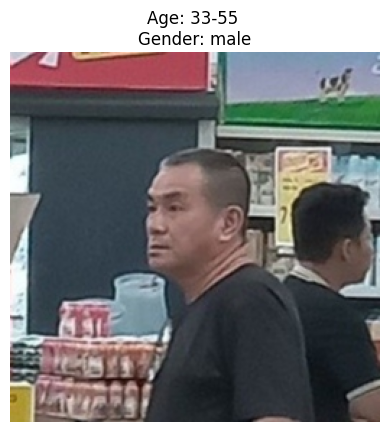

In [ ]:
process_and_predict('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Test/img2.jpg')

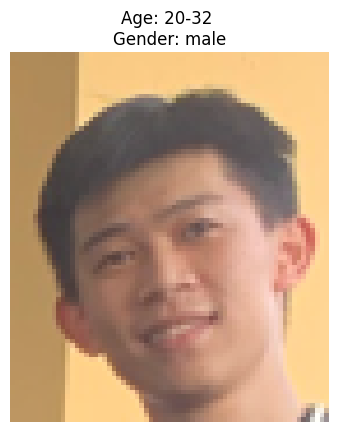

In [ ]:
process_and_predict('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Test/khanh.png')

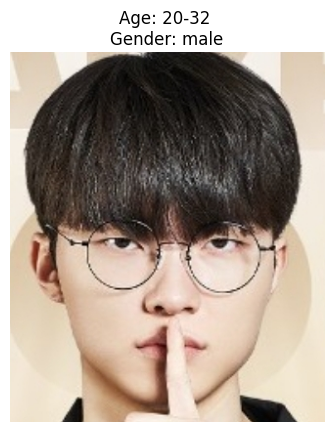

In [ ]:
process_and_predict('/content/drive/MyDrive/CV_FinalProject/Source_code/Dataset/Test/img26.jpg')

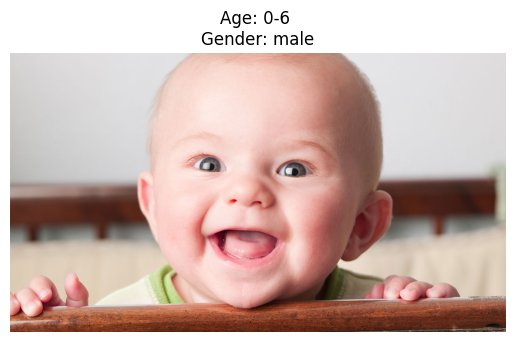

In [ ]:
process_and_predict_url('https://raisingchildren.net.au/__data/assets/image/0024/47742/baby-behaviour-and-awareness.jpg')

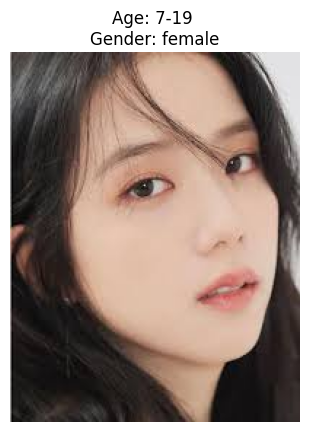

In [ ]:
process_and_predict_url('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcT02JwD62az4CpCpB-2AVj1jS6s1z2nMCoOObKPmQ1p9Q&s')